<a href="https://colab.research.google.com/github/x41lakazam/nutrition-5k/blob/main/notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

My name is Eyal, I am a software engineer at NVIDIA and student in computer science and mathematics at the open university of Israel.

## Problem Description

We aim to develop a data science approach to predict nutritional content, including calories, fat, carbohydrates, and protein, from images of food dishes using the Nutrition5k dataset by Google Research. This dataset provides detailed visual data, such as overhead RGB-D images and side-angle videos, alongside nutritional metadata for approximately 5,000 plates of food from Google cafeterias. Our project focuses on building a proof of concept that uses computer vision and machine learning to estimate nutritional values from visual inputs. This work explores both traditional and advanced modeling techniques, laying the foundation for future applications like dietary tracking apps.

## Motivation

With rising global obesity rates and diet-related health issues, there is a pressing need to improve nutritional awareness. Many people struggle to make informed dietary choices, often misjudging portion sizes or the nutritional value of foods. For instance, individuals frequently underestimate calorie content, contributing to unintentional overconsumption. We are motivated to address this issue, as people often lack clear, accessible information about what constitutes a healthy diet. Our project seeks to demonstrate how visual data can be used to estimate nutritional content accurately, offering a stepping stone toward better dietary decision making.

## Significance

We aim to develop a proof of concept that bridges the gap between advanced technology and everyday health needs by exploring automated nutritional analysis. By combining computer vision with nutritional data, we seek to simplify dietary tracking, which is often tedious and inaccurate. This work could inspire tools that allow users to snap a photo of their meal and instantly understand its nutritional impact, making healthy eating more approachable. The Nutrition5k dataset, with its detailed annotations and unique depth data, provides a robust foundation for testing our models. However, we acknowledge its limitations, as it primarily reflects Western cuisines from select Google cafeterias in California, and does not encompass all food types. Despite this, its rich visual and nutritional data enables us to push the boundaries of dietary analysis, laying groundwork for scalable solutions.

# Miscellanous code



## Setup

In [2]:
%env KAGGLEHUB_CACHE=/content/kagglehub_cache

env: KAGGLEHUB_CACHE=/content/kagglehub_cache


In [3]:
!pip install imagehash dask

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 5.8 MB/s eta 0:00:00


In [4]:
import re
from pathlib import Path
from collections import defaultdict
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


In [5]:
# HYPER PARAMETERS
MAX_FRAMES_PER_DISH = 10

## Utils functions

In [6]:
from typing import Optional
import pandas as pd

# Utils functions
def group_dish_frames_by_camera(dir: Path) -> dict[str, list[str]]:
    """
    Groups files by camera name and sorts them by frame number.

    Args:
        directory_path (str or Path): Path to the directory containing files like camera_Aframe001, camera_Bframe021, etc.

    Returns:
        dict: Dictionary where keys are camera names (A, B, C, D) and values are lists of files sorted by frame number.
    """

    dir = Path(dir)
    camera_files = defaultdict(list)

    # Pattern to match files like camera_Aframe001, camera_Bframe021, etc.
    pattern = re.compile(r'camera_([A-Z])frame(\d+)')

    # Get all files in the directory
    for file_path in dir.iterdir():
        if not file_path.is_file():
            continue

        match = pattern.match(file_path.name)
        if not match:
            continue

        camera_name = match.group(1)
        frame_number = int(match.group(2))

        camera_files[camera_name].append((frame_number, file_path.absolute()))

    # Sort each camera's files by frame number
    for camera in camera_files:
        camera_files[camera].sort(key=lambda x: x[0])  # Sort by frame number
        camera_files[camera] = [filename for _, filename in camera_files[camera]]

    return dict(camera_files)


def hist_and_zoom(dat: pd.Series, title="", zoom=0.99, label=None, bins=None):

    lim = dat.quantile(zoom)

    fig = plt.figure(figsize=(16, 6))
    ax1 = fig.add_subplot(1, 2, 1)
    ax2 = fig.add_subplot(1, 2, 2)

    bins = bins or 30
    ax1.hist(dat, bins=bins, edgecolor='black')
    ax2.hist(dat[dat <= lim], bins=bins, edgecolor='black')

    ax1.set_xlim(dat.min() if dat.min() > 0 else 0, dat.max())
    ax2.set_xlim(dat.min() if dat.min() > 0 else 0, lim) # Ensure min is at least 0 or data min

    if label:
        ax1.set_xlabel(label)
        ax2.set_xlabel(label)

    if title:
        percentile_val = int(zoom * 100)
        ax1.set_title(f"Full Scope: {title}")
        ax2.set_title(f"{title} (zoomed to p{percentile_val})")

    fig.tight_layout()

    return fig


def scatter_and_zoom(x: pd.Series, y: pd.Series, z: Optional[pd.Series] = None, zoom=0.99, title="", labels=None):
    is_3d = z is not None

    if labels:
        if is_3d and len(labels) != 3:
            raise ValueError("Labels of 3d hist should be a tuple (x_label, y_label, z_label)")
        elif is_3d is None and len(labels) != 2:
            raise ValueError("Labels of 2d hist should be a tuple (x_label, y_label)")

    x_lim = x.quantile(zoom)
    y_lim = y.quantile(zoom)
    if is_3d:
        z_lim = z.quantile(zoom)

    fig = plt.figure(figsize=(24, 10))

    if is_3d:
        ax1 = fig.add_subplot(1, 2, 1, projection='3d')
        ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    else:
        ax1 = fig.add_subplot(1, 2, 1)
        ax2 = fig.add_subplot(1, 2, 2)

    for ax in [ax1, ax2]:
        if is_3d:
            ax.scatter(x,y,z)
        else:
            ax.scatter(x,y)

        if labels:
            ax.set_xlabel(labels[0])
            ax.set_ylabel(labels[1])
            if is_3d:
                ax.set_zlabel(labels[2])

    if title:
        ax1.set_title(title)
        ax2.set_title(f"{title} (zoomed to p{int(zoom*100)})")

    ax2.set_xlim(0, x_lim)
    ax2.set_ylim(0, y_lim)
    if is_3d:
        ax2.set_zlim(0, z_lim)

    fig.tight_layout()
    return fig



# Data Collection & Preparation



The Nutrition5k dataset is thoroughly described in the following links:
- GitHub - google-research-datasets/Nutrition5k
  https://github.com/google-research-datasets/Nutrition5k
- Nutrition5k: Towards Automatic Nutritional Understanding of Generic Food
  https://arxiv.org/abs/2103.03375



All data can be downloaded via gsutil from the Google Cloud Storage bucket using the following command:
```bash
gsutil -m cp -r "gs://nutrition5k_dataset/nutrition5k_dataset/"
```

### Key Features
- Scans data for 5,006 plates of food, each containing:
    - 4 rotating side-angle videos
    - Overhead RGB-D images _(when available)_
    - Fine-grained list of ingredients
    - Per-ingredient mass
    - Total dish mass and calories
    - Fat, protein, and carbohydrate macronutrient masses
- Official train/test split
- Nutrition regression eval scripts


### Dataset Contents

The Nutrition5k dataset is structured as follows:

- **Side-Angle Videos**: Stored in imagery/side_angles/ by dish ID.

- **Overhead RGB-D Images**: Located in imagery/realsense_overhead/, including RGB, raw depth, and colorized depth images per dish ID.

- **Dish Metadata**: The metadata/dish_metadata_cafe1/2.csv files contain dish-level data and per-ingredient details, repeated for each ingredient.

- **Train/Test Splits**: Provided in dish_ids/splits/ to ensure robust model evaluation without overlap.

## Metadata Preparation

The metadata CSVs present two main challenges:

- **Repeated Ingredient Fields**: In dish_metadata_cafe[1,2].csv, ingredient details (e.g., ID, name, grams, calories) are repeated within each row for every ingredient in a dish, making it cumbersome for direct analysis in pandas.
    
- **ID Formatting Inconsistency**: In ingredient_metadata.csv, the ingredient ID column is labeled id and requires formatting to match the ingr_[10-digit number] format used in dish_metadata_cafe[1,2].csv, ensuring consistent joins across DataFrames.

To address these issues and make the metadata usable in pandas, we parse the CSVs into structured DataFrames. Below are our functions to process ingredient_metadata.csv and dish_metadata_cafe1.csv:

In [6]:
import pandas as pd
import csv

# Download the metadata files
!gsutil -m cp -r "gs://nutrition5k_dataset/nutrition5k_dataset/metadata/" .

Copying gs://nutrition5k_dataset/nutrition5k_dataset/metadata/dish_metadata_cafe1.csv...
Copying gs://nutrition5k_dataset/nutrition5k_dataset/metadata/ingredients_metadata.csv...
Copying gs://nutrition5k_dataset/nutrition5k_dataset/metadata/dish_metadata_cafe2.csv...
/ [3/3 files][  2.2 MiB/  2.2 MiB] 100% Done                                    
Operation completed over 3 objects/2.2 MiB.                                      


In [7]:
def parse_ingredients_metadata(file_path):
    """
    Parses the ingredients_metadata.csv file into a pandas DataFrame using pd.read_csv.

    :param file_path: str, path to the ingredients metadata CSV file
    :return: pd.DataFrame, ingredient metadata with ingr_id as index
    """
    ingredients_df = pd.read_csv(file_path)
    # Rename columns for clarity
    ingredients_df = ingredients_df.rename(columns={
        'ingr': 'ingr_name',
        'id': 'ingr_id',
        'cal/g': 'cal/g',
        'fat(g)': 'fat(g)',
        'carb(g)': 'carb(g)',
        'protein(g)': 'protein(g)'
    })
    # Format as ingr_XXXXXXXXXX to fit dish_metadata_cafe1.csv naming
    ingredients_df['ingr_id'] = ingredients_df['ingr_id'].apply(lambda x: f'ingr_{x:010d}')
    return ingredients_df

def parse_dish_metadata(file_path):
    """
    Parses the dish_metadata_cafe1.csv file into two pandas DataFrames: one for dish nutrition values
    and one for ingredients.

    :param file_path: str, path to the dish metadata CSV file
    :return: tuple, (pd.DataFrame for dish nutrition values, pd.DataFrame for ingredients)
    """
    dish_nutrition_values = []
    ingredients = []

    with open(file_path, 'r') as f:
        csv_reader = csv.reader(f)

        for row in csv_reader:
            if not row:
                continue

            dish_id = row[0]
            dish_nutrition_values.append({
                'dish_id': dish_id,
                'calories': float(row[1]),
                'mass': float(row[2]),
                'fat': float(row[3]),
                'carb': float(row[4]),
                'protein': float(row[5])
            })

            for i in range(6, len(row), 7):
                ingredients.append({
                    'dish_id': dish_id,
                    'ingr_id': row[i],
                    'ingr_name': row[i + 1],
                    'grams': float(row[i + 2]),
                    'calories': float(row[i + 3]),
                    'fat': float(row[i + 4]),
                    'carb': float(row[i + 5]),
                    'protein': float(row[i + 6])
                })

    nutrition_values_df = pd.DataFrame(dish_nutrition_values)
    dish_ingredients_df = pd.DataFrame(ingredients)
    return nutrition_values_df, dish_ingredients_df

In [8]:
# Paths to the CSV files
dish_path = 'metadata/dish_metadata_cafe1.csv'
ingredients_path ='metadata/ingredients_metadata.csv'

# Parse the CSV files
nutrition_values_df, dish_ingredients_df = parse_dish_metadata(dish_path)
ingredients_metadata_df = parse_ingredients_metadata(ingredients_path)

# Set display options for cleaner output
pd.set_option('display.float_format', '{:.2f}'.format)
pd.set_option('display.max_columns', None)

# Display the head of the DataFrames
print("\nNutrition Values DF head:")
print(nutrition_values_df.head())
print("\nDish Ingredients DF head:")
print(dish_ingredients_df.head())
print("\nIngredients Metadata DF head:")
print(ingredients_metadata_df.head())


Nutrition Values DF head:
           dish_id  calories   mass   fat  carb  protein
0  dish_1561662216    300.79 193.00 12.39 28.22    18.63
1  dish_1562688426    137.57  88.00  8.26  5.19    10.30
2  dish_1561662054    419.44 292.00 23.84 26.35    25.91
3  dish_1562008979    382.94 290.00 22.22 10.17    35.35
4  dish_1560455030     20.59 103.00  0.15  4.62     0.96

Dish Ingredients DF head:
           dish_id          ingr_id   ingr_name  grams  calories  fat  carb  \
0  dish_1561662216  ingr_0000000508   soy sauce   3.40      1.80 0.02  0.17   
1  dish_1561662216  ingr_0000000122      garlic   2.12      3.16 0.01  0.70   
2  dish_1561662216  ingr_0000000026  white rice   8.50     11.05 0.03  2.38   
3  dish_1561662216  ingr_0000000524     parsley   0.21      0.08 0.00  0.01   
4  dish_1561662216  ingr_0000000094      onions   1.71      0.68 0.00  0.15   

   protein  
0     0.28  
1     0.14  
2     0.23  
3     0.01  
4     0.02  

Ingredients Metadata DF head:
        ingr_name   

By parsing dish_metadata_cafe1.csv into nutrition_values_df (dish-level data) and dish_ingredients_df (ingredient-level data), we create a relational structure that simplifies querying, joining, and statistical analysis in pandas, essential for our exploratory analysis and modeling.

#### Initial Overview

In [9]:
# Initial Overview
print("\n=== Initial Overview ===")

# Nutrition Values DF
print("\nNutrition Values DF shape:", nutrition_values_df.shape)
print("\nNutrition Values DF info:")
print(nutrition_values_df.info())
print("\nNutrition Values DF describe:")
print(nutrition_values_df.describe(include='all').transpose())

# Dish Ingredients DF
print("\nDish Ingredients DF shape:", dish_ingredients_df.shape)
print("\nDish Ingredients DF info:")
print(dish_ingredients_df.info())
print("\nDish Ingredients DF describe:")
print(dish_ingredients_df.describe(include='all').transpose())

# Ingredients Metadata DF
print("\nIngredients Metadata DF shape:", ingredients_metadata_df.shape)
print("\nIngredients Metadata DF info:")
print(ingredients_metadata_df.info())
print("\nIngredients Metadata DF describe:")
print(ingredients_metadata_df.describe(include='all').transpose())


=== Initial Overview ===

Nutrition Values DF shape: (4768, 6)

Nutrition Values DF info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4768 entries, 0 to 4767
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   dish_id   4768 non-null   object 
 1   calories  4768 non-null   float64
 2   mass      4768 non-null   float64
 3   fat       4768 non-null   float64
 4   carb      4768 non-null   float64
 5   protein   4768 non-null   float64
dtypes: float64(5), object(1)
memory usage: 223.6+ KB
None

Nutrition Values DF describe:
           count unique              top freq   mean    std  min   25%    50%  \
dish_id     4768   4768  dish_1568314907    1    NaN    NaN  NaN   NaN    NaN   
calories 4768.00    NaN              NaN  NaN 223.98 312.58 0.00 60.95 154.30   
mass     4768.00    NaN              NaN  NaN 191.43 275.05 1.00 72.00 145.00   
fat      4768.00    NaN              NaN  NaN  11.26  24.94 0.00  0.62   6.48

## Images collection

The datasets contain videos of every dishes, the first step was to extract frames from those videos, I did this this ffmpeg-based script that extracts each N-th frame out of a video:

#### Script

In [9]:
#!/bin/bash

# Check if user provided sampling step
if [ -z "$1" ]; then
  echo "Usage: $0 <frame_step>"
  exit 1
fi

frame_step="$1"
max_jobs=$(nproc)   # number of parallel jobs = CPU cores

# Create central output directory
main_outdir="./frames_sampled${frame_step}"
mkdir -p "$main_outdir"

# Find dish directories (exclude frames_sampled folders)
dirs=($(find . -mindepth 1 -maxdepth 1 -type d ! -name "frames_sampled*"))
total_dishes=${#dirs[@]}®
current=0

# Function to process a dish
process_dish() {
  dir="$1"
  dishname=$(basename "$dir")
  outdir="${main_outdir}/${dishname}"
  mkdir -p "$outdir"

  for camera in {A..D}; do
    infile="${dir}/camera_${camera}.h264"
    outfile="${outdir}/camera_${camera}frame%03d.jpeg"

    if [ -f "$infile" ]; then
      ffmpeg -hide_banner -loglevel error -i "$infile" \
        -vf "select=not(mod(n\,${frame_step}))" \
        -fps_mode vfr "$outfile"
    fi
  done
}

export -f process_dish
export frame_step main_outdir

for dir in "${dirs[@]}"; do
  ((current++))
  percent=$(( current * 100 / total_dishes ))
  echo -ne "Queued $dir ($current/$total_dishes) [$percent%]\r"

  process_dish "$dir" &

  # Limit number of background jobs
  while [ "$(jobs -rp | wc -l)" -ge "$max_jobs" ]; do
    sleep 1
  done
done

wait
echo -e "\nDone. Frames extracted to $main_outdir"


CalledProcessError: Command 'b'\n#!/bin/bash\n\n# Check if user provided sampling step\nif [ -z "$1" ]; then\n  echo "Usage: $0 <frame_step>"\n  exit 1\nfi\n\nframe_step="$1"\nmax_jobs=$(nproc)   # number of parallel jobs = CPU cores\n\n# Create central output directory\nmain_outdir="./frames_sampled${frame_step}"\nmkdir -p "$main_outdir"\n\n# Find dish directories (exclude frames_sampled folders)\ndirs=($(find . -mindepth 1 -maxdepth 1 -type d ! -name "frames_sampled*"))\ntotal_dishes=${#dirs[@]}\ncurrent=0\n\n# Function to process a dish\nprocess_dish() {\n  dir="$1"\n  dishname=$(basename "$dir")\n  outdir="${main_outdir}/${dishname}"\n  mkdir -p "$outdir"\n\n  for camera in {A..D}; do\n    infile="${dir}/camera_${camera}.h264"\n    outfile="${outdir}/camera_${camera}frame%03d.jpeg"\n\n    if [ -f "$infile" ]; then\n      ffmpeg -hide_banner -loglevel error -i "$infile" \\\n        -vf "select=not(mod(n\\,${frame_step}))" \\\n        -fps_mode vfr "$outfile"\n    fi\n  done\n}\n\nexport -f process_dish\nexport frame_step main_outdir\n\nfor dir in "${dirs[@]}"; do\n  ((current++))\n  percent=$(( current * 100 / total_dishes ))\n  echo -ne "Queued $dir ($current/$total_dishes) [$percent%]\\r"\n\n  process_dish "$dir" &\n\n  # Limit number of background jobs\n  while [ "$(jobs -rp | wc -l)" -ge "$max_jobs" ]; do\n    sleep 1\n  done\ndone\n\nwait\necho -e "\\nDone. Frames extracted to $main_outdir"\n'' returned non-zero exit status 1.

Usage:


```bash
./sample_frames.sh 5   # samples every 5th
```

The entire dataset is 185 GB of videos, thus exceeds the Colab limit of 100 GB. Therefore I did the frames extraction on my local machine and uploaded them
 to a [Kaggle repository](https://www.kaggle.com/datasets/gillesokhin/nutrition5k-dataset). I will directly load the extracted frames to colab:

```python
# Download version 6
DATA_DIR = kagglehub.dataset_download("gillesokhin/nutrition5k-dataset/versions/6")
print("Path to dataset files:", DATA_DIR)
```

## Loading prepared data

In [10]:
import os
import kagglehub
from pathlib import Path

In [11]:
# Download latest version
DATA_DIR = kagglehub.dataset_download("gillesokhin/nutrition5k-dataset/versions/6")

DATA_DIR = Path(DATA_DIR)

# Create Paths
DNV_PATH = DATA_DIR.joinpath("dish_nutrition_values.csv")
DI_PATH  = DATA_DIR.joinpath("dish_ingredients.csv")
IM_PATH  = DATA_DIR.joinpath("ingredients_metadata.csv")
IMG_PATH  = DATA_DIR.joinpath("imagery")


dishes_dirs = list(Path(f"{IMG_PATH}/side_angles").glob('*'))

# DEBUG LINE - REMOVE
dishes_dirs = dishes_dirs[:10] #DEBUG - REMOVE THE [:10]

print("Side angle dish dir example:", dishes_dirs[0])
print("Path to dataset files:", DATA_DIR.absolute())
print(f"Imagery paths: {IMG_PATH}")

100%|██████████| 21.7G/21.7G [03:43<00:00, 104MB/s]

Extracting files...


Side angle dish dir example: /content/kagglehub_cache/datasets/gillesokhin/nutrition5k-dataset/versions/6/imagery/side_angles/dish_1566417516
Path to dataset files: /content/kagglehub_cache/datasets/gillesokhin/nutrition5k-dataset/versions/6
Imagery paths: /content/kagglehub_cache/datasets/gillesokhin/nutrition5k-dataset/versions/6/imagery


# Data Cleaning



TODO - Detect weird images like those:
/kaggle/input/nutrition5k-dataset/imagery/side_angles/dish_1563465847/camera_Cframe001.jpeg

# CSV cleaning

### Helper Functions
* load_dish_image - show the first available dish image.
* show_top5 - shows images of the 5 highest-calorie dishes.
* plot_top10botom5 - shows a 3×5 grid: top 5, next 5, and bottom 5 dishes by column.
* Draws histograms for multiple numeric columns in a DataFrame.

In [12]:
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

In [13]:
# ---------- Load dish image  ----------
def load_dish_image(dish_id):
    """Return the first available image for a dish, or None if missing."""
    paths = [
        os.path.join(IMG_PATH, "realsense_overhead", dish_id, "rgb.png"),
        os.path.join(IMG_PATH, "side_angles", dish_id, "camera_Aframe001.jpeg"),
        os.path.join(IMG_PATH, "side_angles", dish_id, "camera_Bframe001.jpeg"),
        os.path.join(IMG_PATH, "side_angles", dish_id, "camera_Cframe001.jpeg"),
        os.path.join(IMG_PATH, "side_angles", dish_id, "camera_Dframe001.jpeg"),
    ]
    for p in paths:
        if os.path.exists(p):
            img = Image.open(p)
            return ImageOps.flip(img) if "side_angles" in p else img
    return None

def show_dish(dish_id):
    img = load_dish_image(dish_id)
    plt.figure(figsize=(5, 5))
    if img is not None:
        plt.imshow(img)
    else:
        plt.text(0.5, 0.5, "Missing", ha="center", va="center", fontsize=14)

    plt.title(f'{dish_id}', fontsize=12)
    plt.axis("off")
    plt.show()

# ---------- Top 5 ----------
def show_top5(df):
    top5 = df.nlargest(5, "calories")

    fig, axes = plt.subplots(1, 5, figsize=(22, 6))
    for ax, (_, r) in zip(axes, top5.iterrows()):
        img = load_dish_image(r["dish_id"])
        if img is not None:
            ax.imshow(img)
        else:
            ax.text(0.5, 0.5, "Missing", ha="center", va="center", fontsize=12)

        ax.set_title(f'{r["dish_id"]}', fontsize=12)
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ---------- Top 10 + Bottom 5 ----------
def plot_top10botom5(df, column="calories"):
    top5    = df.nlargest(5, column)
    top10_6 = df.nlargest(10, column).tail(5)
    bottom5 = df.nsmallest(5, column)

    groups = [top5, top10_6, bottom5]

    fig, axes = plt.subplots(3, 5, figsize=(22, 14))
    for row_axes, group_df in zip(axes, groups):
        for ax, (_, r) in zip(row_axes, group_df.iterrows()):
            img = load_dish_image(r["dish_id"])
            if img is not None:
                ax.imshow(img)
            else:
                ax.text(0.5, 0.5, "Missing", ha="center", va="center", fontsize=12)

            ax.set_title(f'{r["dish_id"]}\n {column} = {r[column]:.0f}', fontsize=12)
            ax.axis("off")

    plt.tight_layout()
    plt.show()


In [14]:
# ---------- Plot Distributions ----------
def plot_distributions(df, cols, bins=50):
    """
    Plot histograms for selected columns in a DataFrame.

    Args:
        df (pd.DataFrame): DataFrame with numeric columns.
        cols (list): List of column names to plot.
        bins (int): Number of bins for histograms.
    """
    plt.figure(figsize=(12, 8))
    for i, col in enumerate(cols, 1):
        plt.subplot(2, 3, i)
        df[col].hist(bins=bins, edgecolor="black")
        plt.title(f"Distribution of {col}")
        plt.xlabel(col)
        plt.ylabel("Count")

    plt.tight_layout()
    plt.show()

## Data Integrity Audit


1. **Duplicates**  
   - Counts duplicate rows in each table and duplicate *(dish_id, ingr_id)* pairs in **Dish Ingredients**.

2. **Missing Values**  
   - Reports total missing per table and, when present, shows per-column counts.

3. **Consistency**  
   - Referential integrity checks:  
     - Every `dish_id` in **Dish Ingredients** must exist in **Nutrition Values**.  
     - Every `ingr_id` in **Dish Ingredients** must exist in **Ingredients Metadata**.

4. **Uniqueness**  
   - Flags duplicate ingredient names (`ingr_name`).  
   - Counts dishes that have a row in **Nutrition Values** but **no matching rows** in **Dish Ingredients**.

In [15]:
import pandas as pd
import numpy as np

In [16]:
# === Load DataFrames from Kaggle ===
nutrition_values_df = pd.read_csv(DNV_PATH) if os.path.exists(DNV_PATH) else None
dish_ingredients_df  = pd.read_csv(DI_PATH) if os.path.exists(DI_PATH)  else None
ingredients_metadata_df  = pd.read_csv(IM_PATH) if os.path.exists(IM_PATH)  else None

In [17]:
"""
# === Data Quality Checks ===
print("=== Data Integrity Audit ===")
print("=" * 40)

# 1. Duplicates
print("\n[1] Duplicates")
print(f"  • Nutrition Values duplicate rows: {nutrition_values_df.duplicated().sum()}")
print(f"  • Dish Ingredients duplicate rows: {dish_ingredients_df.duplicated().sum()}")
print(f"  • Dish Ingredients duplicate dish+ingr pairs: "
      f"{dish_ingredients_df.duplicated(subset=['dish_id', 'ingr_id']).sum()}")
print(f"  • Ingredients Metadata duplicate rows: {ingredients_metadata_df.duplicated().sum()}")

# 2. Missing values (simplified)
print("\n[2] Missing Values")
for name, df in {
    "Nutrition Values": nutrition_values_df,
    "Dish Ingredients": dish_ingredients_df,
    "Ingredients Metadata": ingredients_metadata_df
                }.items():
    missing = df.isna().sum()
    total_missing = int(missing.sum())
    print(f"  • {name}: {total_missing} missing values",
          f"-> {dict(missing[missing > 0])}" if total_missing else "")

# 3. Consistency checks
print("\n[3] Consistency Checks")
missing_dishes = set(dish_ingredients_df["dish_id"]) - set(nutrition_values_df["dish_id"])
missing_ingrs = set(dish_ingredients_df["ingr_id"]) - set(ingredients_metadata_df["ingr_id"])
print(f"  • Dish IDs in dish_ingredients not in nutrition_values: {len(missing_dishes)}")
print(f"  • Ingr IDs in dish_ingredients not in ingredients_metadata: {len(missing_ingrs)}")

# 4. Uniqueness checks
print("\n[4] Uniqueness Checks")
dup_ingr_names = ingredients_metadata_df["ingr_name"].duplicated().sum()
dishes_with_ingr_ids = set(dish_ingredients_df["dish_id"])
dishes_no_ingr = nutrition_values_df[~nutrition_values_df["dish_id"].isin(dishes_with_ingr_ids)]
print(f"  • Duplicate ingredient names: {dup_ingr_names}")
print(f"  • Dishes without ingredients: {len(dishes_no_ingr)}")
"""

'\n# === Data Quality Checks ===\nprint("=== Data Integrity Audit ===")\nprint("=" * 40)\n\n# 1. Duplicates\nprint("\n[1] Duplicates")\nprint(f"  • Nutrition Values duplicate rows: {nutrition_values_df.duplicated().sum()}")\nprint(f"  • Dish Ingredients duplicate rows: {dish_ingredients_df.duplicated().sum()}")\nprint(f"  • Dish Ingredients duplicate dish+ingr pairs: "\n      f"{dish_ingredients_df.duplicated(subset=[\'dish_id\', \'ingr_id\']).sum()}")\nprint(f"  • Ingredients Metadata duplicate rows: {ingredients_metadata_df.duplicated().sum()}")\n\n# 2. Missing values (simplified)\nprint("\n[2] Missing Values")\nfor name, df in {\n    "Nutrition Values": nutrition_values_df,\n    "Dish Ingredients": dish_ingredients_df,\n    "Ingredients Metadata": ingredients_metadata_df\n                }.items():\n    missing = df.isna().sum()\n    total_missing = int(missing.sum())\n    print(f"  • {name}: {total_missing} missing values",\n          f"-> {dict(missing[missing > 0])}" if total_mis

## Data Issues & Investigation


Issue 1: Missing Ingredient Name:

  `Dish Ingredients: 1 missing values -> {'ingr_name': np.int64(1)}`  

Issue 2: Duplicate ingredient:

  `Duplicate ingredient names: 3`

#### Investigation Issue 1


1) Locate Dishes Containing the Problematic Ingredient.

In [18]:
"""
missing_ingr_name_rows = dish_ingredients_df[dish_ingredients_df["ingr_name"].isna()]

print("=== Rows with missing ingr_name ===")
print(missing_ingr_name_rows)
"""

'\nmissing_ingr_name_rows = dish_ingredients_df[dish_ingredients_df["ingr_name"].isna()]\n\nprint("=== Rows with missing ingr_name ===")\nprint(missing_ingr_name_rows)\n'

2) Inspect All Ingredients for `dish_1568666357` and Show Photo

In [19]:
"""
dish_id = "dish_1568666357"
dish_rows = dish_ingredients_df[dish_ingredients_df["dish_id"] == dish_id]

print(f"=== Ingredients for {dish_id} ===")
print(dish_rows)
show_dish(dish_id)
"""

'\ndish_id = "dish_1568666357"\ndish_rows = dish_ingredients_df[dish_ingredients_df["dish_id"] == dish_id]\n\nprint(f"=== Ingredients for {dish_id} ===")\nprint(dish_rows)\nshow_dish(dish_id)\n'

The following row was identified with a missing `ingr_name`:

| dish_id        | ingr_id        | ingr_name | grams | calories | fat   | carb | protein |
|----------------|----------------|-----------|-------|----------|-------|------|---------|
| dish_1568666357 | ingr_0000000546 | NaN       | 9.0   | 7.92     | 0.000 | 1.53 | 0.045   |

After nutrition lookup, this matches balsamic vinegar.

###### External Validation
After nutrition lookup, this record matches balsamic vinegar.  
We also confirmed with the table uploaded to Kaggle that it is in fact the correct ingredient.  
This suggests the data might have been corrupted at some point.
Since we have not yet made any changes to the data, we do not know what caused the issue.

##### Conclusion
- The missing `ingr_name` corresponds to **balsamic vinegar**.  
- Fix applied in both `dish_ingredients_df` and `ingredients_metadata_df`.  

In [20]:
# Fix in dish_ingredients_df
dish_ingredients_df.loc[
    dish_ingredients_df["ingr_id"] == "ingr_0000000546", "ingr_name"
] = "balsamic vinegar"

# Fix in ingredients_metadata_df
ingredients_metadata_df.loc[
    ingredients_metadata_df["ingr_id"] == "ingr_0000000546", "ingr_name"
] = "balsamic vinegar"

# Validataion
print(dish_ingredients_df.query("ingr_id == 'ingr_0000000546'"))
print(ingredients_metadata_df.query("ingr_id == 'ingr_0000000546'"))

               dish_id          ingr_id         ingr_name  grams  calories  \
19286  dish_1568666357  ingr_0000000546  balsamic vinegar   9.00      7.92   

       fat  carb  protein  
19286 0.00  1.53     0.04  
            ingr_name          ingr_id  cal/g  fat(g)  carb(g)  protein(g)
545  balsamic vinegar  ingr_0000000546   0.88    0.00     0.17        0.01


In [21]:
# Show duplicate ingredient names
dup_ingr_names_df = ingredients_metadata_df[ingredients_metadata_df["ingr_name"].duplicated(keep=False)]
print(dup_ingr_names_df.sort_values("ingr_name"))

      ingr_name          ingr_id  cal/g  fat(g)  carb(g)  protein(g)
230  deprecated  ingr_0000000231   0.91    0.00     0.23        0.01
452  deprecated  ingr_0000000453   0.52    0.00     0.00        0.14
457  deprecated  ingr_0000000458   0.30    0.00     0.08        0.01
469  deprecated  ingr_0000000470   0.93    0.00     0.21        0.03


#### Investigation Issue 2

1. Find ingredient names that occur more than once

In [22]:
# Find ingredient names that occur more than once
dup_ingr_names_list = (
    ingredients_metadata_df["ingr_name"]
    .value_counts()
    .loc[lambda x: x > 1]
)

print("Duplicate ingredient names:")
print(dup_ingr_names_list)

Duplicate ingredient names:
ingr_name
deprecated    4
Name: count, dtype: int64


2. Find ingredients with name = "deprecated"
3. Show 5 dishes contaning "deprecated" ingredinget

['ingr_0000000231', 'ingr_0000000453', 'ingr_0000000458', 'ingr_0000000470']

=== Deprecated ingredient: ingr_0000000231 ===
No dishes found with this ingredient.

=== Deprecated ingredient: ingr_0000000453 ===


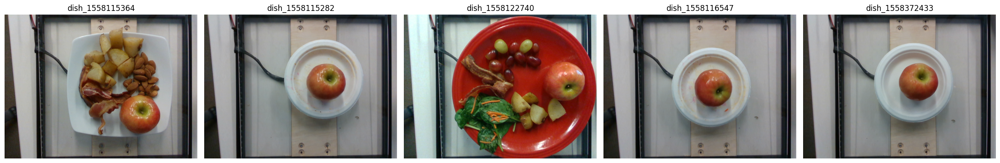


=== Deprecated ingredient: ingr_0000000458 ===


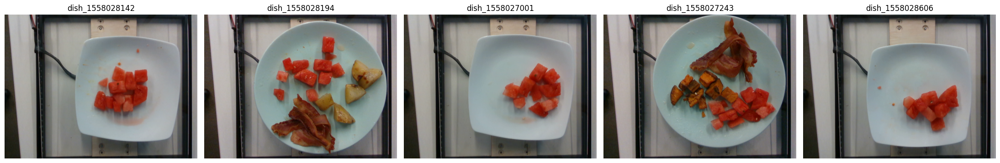


=== Deprecated ingredient: ingr_0000000470 ===
No dishes found with this ingredient.


In [23]:
# Find ingredient(s) with name = "deprecated"
deprecated_ingr_df = ingredients_metadata_df[ingredients_metadata_df["ingr_name"].str.lower() == "deprecated"]

deprecated_ingr_list = sorted(dup_ingr_names_df["ingr_id"])

print (deprecated_ingr_list)

# Loop through each deprecated ingredient and find dishes containing it
for ingr in deprecated_ingr_list:
    dishes_with_ingr = dish_ingredients_df[dish_ingredients_df["ingr_id"] == ingr]
    if not dishes_with_ingr.empty:
        print(f"\n=== Deprecated ingredient: {ingr} ===")
        show_top5(dishes_with_ingr)

    else:
        print(f"\n=== Deprecated ingredient: {ingr} ===")
        print("No dishes found with this ingredient.")

##### Conclusion
- Found 4 `ingr_ids` with name **"deprecated"**.  
- `ingr_0000000231` and `ingr_0000000470` do not exist in any dish → ignored.  
- `ingr_0000000453` corresponds to **apple**.  
- `ingr_0000000458` corresponds to **watermelon**.  
- Fix applied in `dish_ingredients_df`.

In [24]:
# Fix deprecated ingredient names
dish_ingredients_df.loc[dish_ingredients_df["ingr_id"] == "ingr_0000000453", "ingr_name"] = "apple"
dish_ingredients_df.loc[dish_ingredients_df["ingr_id"] == "ingr_0000000458", "ingr_name"] = "watermelon"

## Data Integrity Audit (Continuation)


5. **Nutrient Consistency — dish totals vs. ingredient sums**  
   - **What it checks:** For each `dish_id`, compares dish-level totals in **Nutrition Values** (`calories`, `fat`, `carb`, `protein`) with the **sum of those nutrients across all the dish’s ingredient rows** in **Dish Ingredients**.  
   - **How it’s measured (per nutrient):**  
$$
\text{rel_err}(\%) \;=\;
\frac{\text{dish total} \;-\; \sum_{i \in \text{ingredients}} \text{nutrient}_i}
     {\sum_{i \in \text{ingredients}} \text{nutrient}_i}
\times 100
$$
     Dishes are flagged when **any** nutrient exceeds **±0.1%**.  
   - **Why it can fail:** missing/extra ingredient rows, serving-size or unit mismatches, cooked vs. raw basis differences, or heavy rounding.  
   - **Edge cases:** dishes where the ingredient sum is zero are skipped (division-by-zero handled as `NaN`).

6. **Ingredient Metadata Consistency — per-gram & per-dish**  
   - **What it checks:** Validates nutrients against canonical **per-gram** rates from **Ingredients Metadata**.  
     - **Per-gram:** compare `calc_*_per_g = nutrient / grams` from **Dish Ingredients** to metadata fields (`cal/g`, `fat(g)`, `carb(g)`, `protein(g)`).  
     - **Per-dish (reconstructed):** compute expected dish totals as `grams × per_g` per ingredient, sum by `dish_id`, and compare to summed dish-ingredient nutrients.  
   - **Flagging:** a dish is flagged if **any** nutrient’s relative error exceeds **±0.1%**.  
   - **Why it can fail:** outdated/incorrect metadata densities, unit errors (e.g., mg vs g), wrong `grams`, brand/variant differences.  
   - **Edge cases:** rows with `grams == 0` are treated as `NaN` to avoid inflated per-gram values.

In [25]:
# 5. Nutrient consistency: dish totals vs. sum of ingredient nutrients
print("\n[5] Nutrient Consistency (Dish totals vs. ingredient sums)")

nutrients = ["calories", "fat", "carb", "protein"]
threshold = 0.1  # percent

# Sum ingredient nutrients by dish_id
ingr_sums = (
    dish_ingredients_df.groupby("dish_id")[nutrients]
    .sum()
    .reset_index()
    .rename(columns={c: f"{c}_ingr_sum" for c in nutrients})
)

# Join with dish-level totals
dish_compare = nutrition_values_df.merge(ingr_sums, on="dish_id", how="inner")

# Relative error (%) per nutrient
for n in nutrients:
    diff = dish_compare[n] - dish_compare[f"{n}_ingr_sum"]
    base = dish_compare[f"{n}_ingr_sum"].replace(0, np.nan)
    dish_compare[f"{n}_rel_err_%"] = (diff / base) * 100

rel_cols = [f"{n}_rel_err_%" for n in nutrients]
# Count dishes where any nutrient exceeds ±threshold%
n_discrepant = int(dish_compare[rel_cols].abs().gt(threshold).any(axis=1).sum())

print(f"  • Dishes evaluated: {len(dish_compare)}")
print(f"  • Dishes with > ±{threshold}% error in any nutrient: {n_discrepant}")


[5] Nutrient Consistency (Dish totals vs. ingredient sums)
  • Dishes evaluated: 4768
  • Dishes with > ±0.1% error in any nutrient: 0


In [26]:
# 6. Ingredient Metadata Consistency (per-gram & per-dish)
print("\n[6] Ingredient Metadata Consistency (per-gram & per-dish)")

nutrients = ["calories", "fat", "carb", "protein"]
threshold = 0.1  # percent

# --- Merge ingredients with metadata ---
merged = pd.merge(
    dish_ingredients_df,
    ingredients_metadata_df,
    on="ingr_id",
    how="left",
    suffixes=("", "_md"),
)

# --- Per-gram calc from dish data ---
g = merged["grams"].replace(0, np.nan)
merged["calc_cal_per_g"]  = merged["calories"] / g
merged["calc_fat_per_g"]  = merged["fat"]      / g
merged["calc_carb_per_g"] = merged["carb"]     / g
merged["calc_pro_per_g"]  = merged["protein"]  / g

# --- Metadata per-gram reference ---
merged["md_cal_per_g"]  = merged["cal/g"]
merged["md_fat_per_g"]  = merged["fat(g)"]
merged["md_carb_per_g"] = merged["carb(g)"]
merged["md_pro_per_g"]  = merged["protein(g)"]

# (Optional internal diffs for debugging; not printed)
merged["diff_cal_per_g"]  = merged["calc_cal_per_g"]  - merged["md_cal_per_g"]
merged["diff_fat_per_g"]  = merged["calc_fat_per_g"]  - merged["md_fat_per_g"]
merged["diff_carb_per_g"] = merged["calc_carb_per_g"] - merged["md_carb_per_g"]
merged["diff_pro_per_g"]  = merged["calc_pro_per_g"]  - merged["md_pro_per_g"]

# --- Per-dish totals (calc vs metadata) ---
calc_totals = dish_ingredients_df.groupby("dish_id")[["calories","fat","carb","protein","grams"]].sum()

meta = pd.merge(dish_ingredients_df, ingredients_metadata_df, on="ingr_id", how="left")
meta["calories_md"] = meta["grams"] * meta["cal/g"]
meta["fat_md"]      = meta["grams"] * meta["fat(g)"]
meta["carb_md"]     = meta["grams"] * meta["carb(g)"]
meta["protein_md"]  = meta["grams"] * meta["protein(g)"]
meta_totals = meta.groupby("dish_id")[["calories_md","fat_md","carb_md","protein_md"]].sum()

dish_compare = calc_totals.join(meta_totals, how="left")

# Relative error (%) per nutrient
for n in nutrients:
    md_col = f"{n}_md"
    base = dish_compare[md_col].replace(0, np.nan)
    dish_compare[f"{n}_rel_err_%"] = ((dish_compare[n] - dish_compare[md_col]) / base) * 100

rel_cols = [f"{n}_rel_err_%" for n in nutrients]
n_discrepant = int(dish_compare[rel_cols].abs().gt(threshold).any(axis=1).sum())

print(f"  • Dishes evaluated: {len(dish_compare)}")
print(f"  • Dishes with > ±{threshold}% error in any nutrient: {n_discrepant}")


[6] Ingredient Metadata Consistency (per-gram & per-dish)
  • Dishes evaluated: 4768
  • Dishes with > ±0.1% error in any nutrient: 0


### Data Integrity Audit Conclusion

Both Nutrient Consistency and Ingredient Metadata Consistency Audit check passed under the ±0.1% tolerance, which we set specifically to absorb floating-point rounding we observed, this strongly suggests dish totals are being derived as sum(grams × per_g) from the metadata, so the ingredients, metadata, and dish-level values are internally coherent. Practically, that means the pipeline is behaving as expected.

## Filtering Dishes Without Images

Some dishes in the dataset lack imagery because their original video recordings were corrupted, making it impossible to extract usable frames.
Since images are essential for downstream tasks (such as computer vision modeling and visual feature extraction), we exclude any dishes without usable imagery.

To achieve this, we define a helper function has_images(dish_id) that checks if a dish has at least one valid image in one of two locations:

- Side-angle images at imagery/side_angles/
- Overhead images at imagery/realsense_overhead/

A dish passes the filter if at least one of these directories exists and contains files.

After applying this filter, we generate statistics showing how many dishes remain and how many were dropped due to corrupted/missing imagery.

In [27]:
def has_images(dish_id):
    side_dir = os.path.join(DATA_DIR, "imagery", "side_angles", str(dish_id))
    overhead_dir = os.path.join(DATA_DIR, "imagery", "realsense_overhead", str(dish_id))

    side_ok = os.path.exists(side_dir) and len(os.listdir(side_dir)) > 0
    overhead_ok = os.path.exists(overhead_dir) and len(os.listdir(overhead_dir)) > 0
    return side_ok or overhead_ok

# Apply filter
original_size = len(nutrition_values_df)
mask = nutrition_values_df["dish_id"].apply(has_images)
filtered_df = nutrition_values_df[mask].reset_index(drop=True)
after_image_filter_size = len(filtered_df)

# Pretty print stats
print("=== Imagery Filter Stats ===")
print(f"Original dataset size      : {original_size}")
print(f"After image filter size    : {after_image_filter_size}")
print(f"Removed due to imagery gap : {original_size - after_image_filter_size}")
print("=" * 34)

=== Imagery Filter Stats ===
Original dataset size      : 4768
After image filter size    : 4756
Removed due to imagery gap : 12


## Removing Nutritional Outliers

Before deciding how to handle outliers, it's important to understand the overall distribution of the nutritional attributes. Visualization helps reveal where most data points lie and whether extreme cases stand out.

The block below calls a helper function plot_distributions on five key features:

- Calories
- Mass
- Fat
- Carbohydrates
- Protein

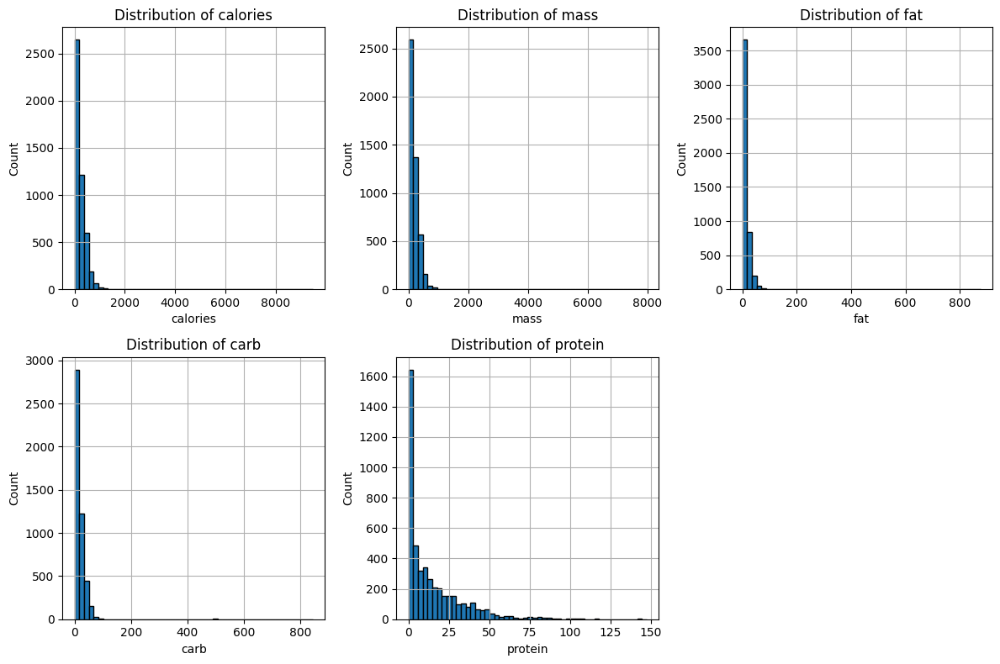

In [28]:
nutrition_values_df = filtered_df
# Example call
cols = ["calories", "mass", "fat", "carb", "protein"]
plot_distributions(nutrition_values_df, ["calories", "mass", "fat", "carb", "protein"])

For each nutrient, most dishes cluster below a reasonable cutoff, with only a small number of dishes above that point. Those few high values are exactly what we want to inspect next.

## Plotting Outliers (top and bottom values)

To better understand these extremes, we useed a simple outlier check that plots the 10 highest values together with the lowest 5 values for each nutrient.

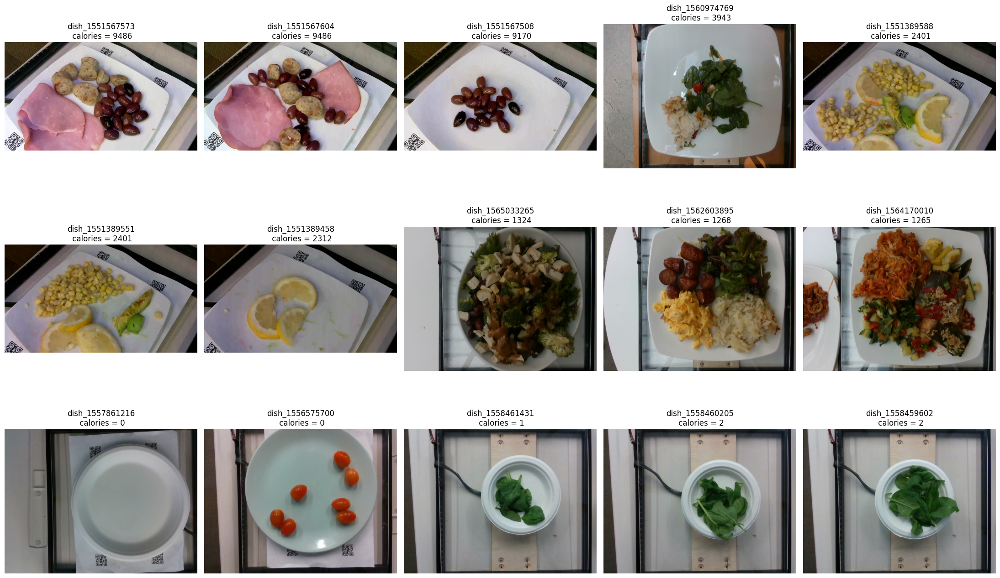

In [29]:
plot_top10botom5(nutrition_values_df, "calories")

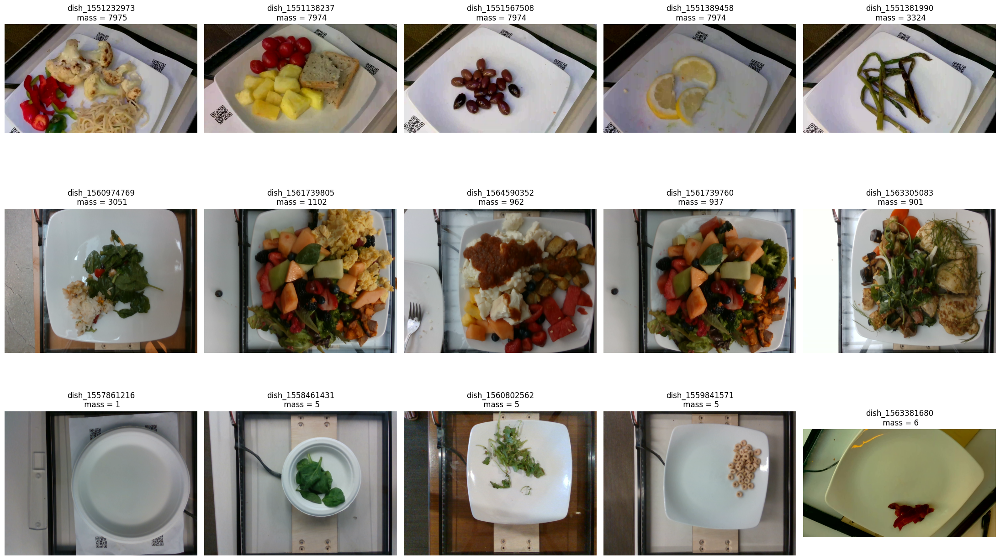

In [30]:
plot_top10botom5(nutrition_values_df, "mass")

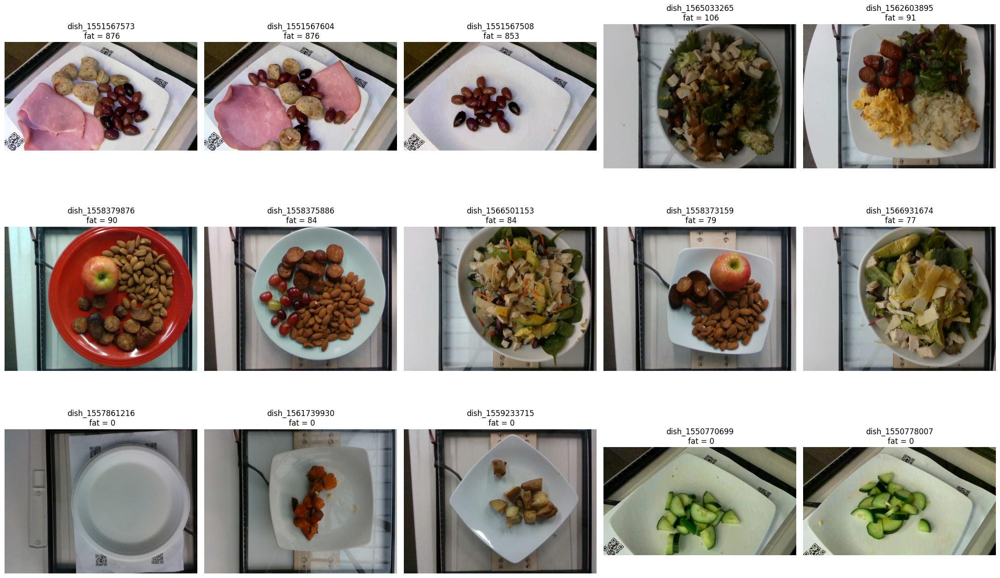

In [31]:
plot_top10botom5(nutrition_values_df, "fat")

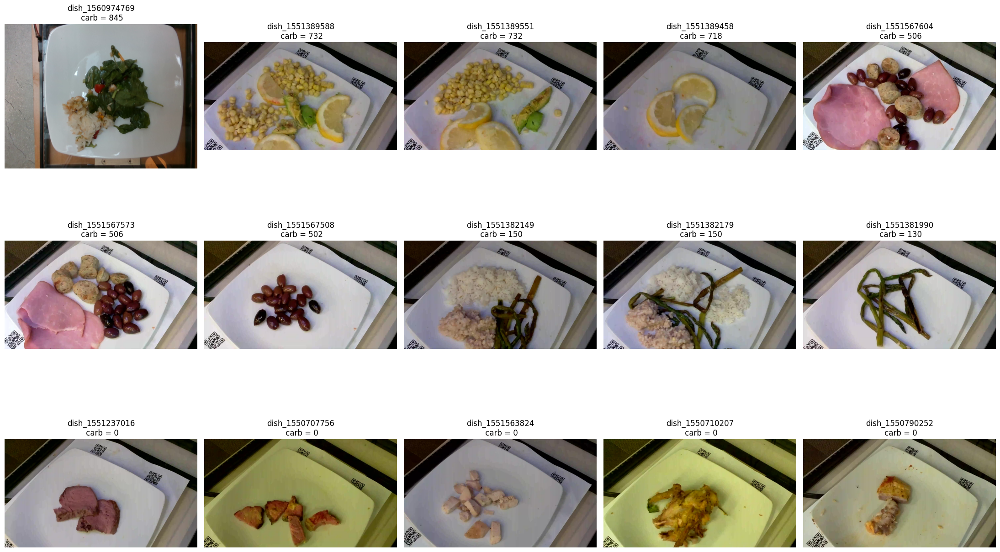

In [32]:
plot_top10botom5(nutrition_values_df, "carb")

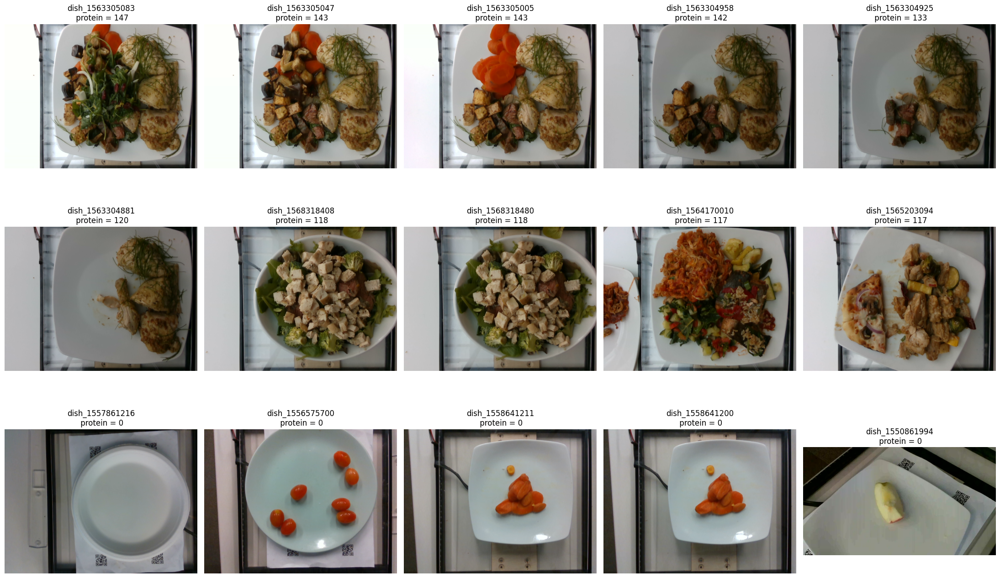

In [33]:
plot_top10botom5(nutrition_values_df, "protein")

From the outlier inspection, we saw that each nutrient has a natural cutoff where almost all dishes fall below, and everything above is clearly mislabeled. These thresholds mark the point where normal values end and mislabeled extremes begin.

In addition to the numeric mislabels detected through upper bounds, we also discovered a dish that was mislabeled as empty.
Since the image clearly shows that this dish is not empty, we manually remove this specific case from the dataset.

## Outlier Removal

This block removes dishes with mislabeled  nutrition values (above the defined upper bounds) and also drops one dish that was mislabeled as empty.

In [34]:
calories_upper = 1400
mass_upper = 1200
fat_upper = 120
carb_upper = 160
protein_upper = 150
manual_outliers = ["dish_1556575700"] # Not an empty dish with 0 calories

# Identify outliers from calories range
outliers = nutrition_values_df[
    (nutrition_values_df["calories"] > calories_upper) |
    (nutrition_values_df["mass"]     > mass_upper)     |
    (nutrition_values_df["fat"]      > fat_upper)      |
    (nutrition_values_df["carb"]     > carb_upper)     |
    (nutrition_values_df["protein"]  > protein_upper)
]

# Add manual outliers (force include by dish_id)
manual_mask = nutrition_values_df["dish_id"].isin(manual_outliers)
manual_outliers_df = nutrition_values_df[manual_mask]

# Combine automatic + manual outliers
outliers = pd.concat([outliers, manual_outliers_df]).drop_duplicates()

# Save size before dropping
before_size = len(nutrition_values_df)

# Drop outliers
nutrition_values_df = nutrition_values_df.drop(outliers.index).copy()

# Print summary
print("=== Outlier Removal Stats ===")
print("Size before outlier removal:", before_size)
print("Size after outlier removal:", len(nutrition_values_df))
print("Removed entries (outliers):", len(outliers))
print("=" * 34)

=== Outlier Removal Stats ===
Size before outlier removal: 4756
Size after outlier removal: 4745
Removed entries (outliers): 11


### Why we choose not to use IQR

A common way to detect outliers is the IQR method, which flags values that fall far above or below the middle range of the data.

- Too aggressive, Nutritional data naturally includes some very large dishes (high calories, carbs, or protein). The IQR method would incorrectly remove many of these valid entries.
- Data quality issue, The extreme values we saw were clearly implausible mislabels, not natural variation. These need targeted handling rather than a broad statistical rule.

By using upper bounds and manual checks, we focused only on entries that were definitely wrong, while keeping unusual but valid dishes in the dataset.

In [35]:
!pip install imagehash progressbar2

from pathlib import Path
from itertools import pairwise
from PIL import Image
import imagehash
import progressbar
import time

# Images cleaning



### Duplicates removal
The videos are filmed by a camera that rotates around the dish, frames are extracted at a constant rate from the films.
Sometimes, the camera stay idle and it leads to duplicated frames
The cameras someimtes stay idle during the videos, leading to duplicate frames.


Here we remove pure duplicates, in the EDA we will explore more complex options to evict similar frames.


To detect pure duplicates, we use average-hashing, a perceptual hashing algorithm that ignore minor modifications in the images.

In [36]:
import imagehash
from pathlib import Path
import progressbar
from PIL import Image
from itertools import pairwise

def find_duplicates(dir: Path, remove: bool = False) -> int:
    """
    Duplicates are assumed to happen only in consecutive images
    Arguments:
        dir: The dish frames directory

    Returns
        Number of duplicates found
    """
    found = 0
    cam_frames = group_dish_frames_by_camera(dir)
    for cam, frames in cam_frames.items():
        dups = []
        img1_hash = imagehash.average_hash(Image.open(frames[0]))
        for img1, img2 in pairwise(frames):
            img2_hash = imagehash.average_hash(Image.open(img2))
            if img1_hash == img2_hash:
                dups.append(img2)
            img1_hash = img2_hash

        if remove:
            for file in dups:
                Path(file).unlink()

        found += len(dups)

    return found

found_duplicates = 0
for dir in progressbar.progressbar(dishes_dirs):
    found_duplicates += find_duplicates(dir)

print("")
print(f"Removed {found_duplicates} duplicates in {len(dishes_dirs)} directories.")

100% (10 of 10) |########################| Elapsed Time: 0:00:22 Time:  0:00:22



Removed 144 duplicates in 10 directories.


# Exploratory data analysis


### Frames similarity

We already evicted pure duplicates in the cleaning.
This evicts frames that are too similar, i.e for which the angle of rotation is too low.

#### Helper function: FMT image registration algorithm
The Mellin Fourrier Transform algorithm calculates the rotation angle between two images. We will use it to verify how similar two images are.

We considered using other image registration algorithm like ORB comparison, but FMT seemed to be the fastest one, considering the amount of data that has to be processed.

In [41]:
import numpy as np
from scipy.fft import fft2, ifft2
from skimage.transform import warp_polar
from skimage.registration import phase_cross_correlation
from skimage.util import img_as_float, crop
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def fmt_rotation(ref_frame, current_frame):
    """
    Estimates the rotation angle in degrees (<=180) between two images using the Fourier-Mellin Transform (FMT)
    and Phase Correlation, robust to translation.

    This function implements Step 1 of the FMT method.

    Args:
        ref_frame (np.ndarray): The reference image (Frame A).
        current_frame (np.ndarray): The image to compare (Frame B).

    Returns:
        float: The estimated rotation angle (in degrees).
    """
    # 1. Pre-process: Convert to float and handle potential color channels (if not grayscale)
    ref_float = img_as_float(ref_frame)
    current_float = img_as_float(current_frame)

    if ref_float.ndim == 3:
        # Convert to grayscale if it's a color image
        ref_float = np.mean(ref_float, axis=2)
        current_float = np.mean(current_float, axis=2)

    H, W = ref_float.shape
    center = (H // 2, W // 2)


    max_radius = min(H, W) // 2

    # 2. Compute Magnitude Spectra (Translation Invariant)
    # The magnitude spectrum is invariant to translation.
    ref_fft = fft2(ref_float)
    current_fft = fft2(current_float)

    # We take the log of the magnitude spectrum to dampen high-frequency components
    # and use abs() for the magnitude.
    ref_mag = np.abs(ref_fft)
    current_mag = np.abs(current_fft)

    # Log-magnitude is often used to make the rotation peaks clearer
    ref_log_mag = np.log1p(ref_mag)
    current_log_mag = np.log1p(current_mag)


    # 3. Log-Polar Transformation
    # Rotation in Cartesian space becomes vertical translation in Log-Polar space.

    # Define output shape for the Log-Polar map:
    # Height (angles), Width (radii). Standard choice: e.g., 360 angular bins.
    output_shape = (360, max_radius)

    # warp_polar maps Cartesian space to Polar/Log-Polar space.
    ref_lpm = warp_polar(
        ref_log_mag,
        output_shape=output_shape,
        center=center,
        radius=max_radius,
        scaling='log',
        order=1  # Bilinear interpolation
    )

    current_lpm = warp_polar(
        current_log_mag,
        output_shape=output_shape,
        center=center,
        radius=max_radius,
        scaling='log',
        order=1
    )

    # For Phase Correlation, we often crop to remove the center artifact
    # e.g., crop 1/4 of the angular height for a cleaner correlation.
    crop_h = ref_lpm.shape[0] // 4
    ref_lpm_cropped = crop(ref_lpm, ((crop_h, 0), (0, 0)))
    current_lpm_cropped = crop(current_lpm, ((crop_h, 0), (0, 0)))

    # 4. Phase Correlation on Log-Polar Map
    # Find the shift (translation) in the Log-Polar map. The vertical shift (row index)
    # corresponds to the rotation angle.
    shifts, _, _ = phase_cross_correlation(
        ref_lpm_cropped,
        current_lpm_cropped,
        upsample_factor=10 # Use sub-pixel resolution for higher accuracy
    )

    # Shift is (row_shift, col_shift). Row shift is the angular shift (rotation).
    # The shift is measured in bins/pixels of the angular (row) dimension.
    angular_shift_bins = shifts[0]

    # 5. Convert Shift to Angle
    # The total angular range is 360 degrees, mapped to the number of rows (360 - crop_h).
    # Note: We use the full 360 bins for mapping since the crop only removes the high-frequency center/edges.

    # Angle calculation: (shift_in_bins / total_angular_bins) * 360 degrees
    # The angular dimension wraps around, so we account for the circular shift.

    total_angular_bins = output_shape[0] - crop_h
    angle_per_bin = 360.0 / output_shape[0]

    # The shift from phase_cross_correlation is relative to the cropped array's dimensions
    rotation_angle = angular_shift_bins * angle_per_bin

    # Ensure angle is in the range (-180, 180] for comparison purposes
    # For a circular shift, the shortest distance is what matters.
    if rotation_angle > 180:
        rotation_angle -= 360
    elif rotation_angle <= -180:
        rotation_angle += 360

    return rotation_angle

def get_rotation_of_frames(frames: list[Path], absval=True):
    """Return rotation of frames relative to frame 0"""
    first_img = np.asarray(Image.open(frames[0]))
    rotations = [0]
    for frame in frames[1:]:
        img = np.asarray(Image.open(frame))
        rotation = fmt_rotation(first_img, img)
        rotation = rotation % 360
        rotations.append(rotation)

    return rotations



#### Helper function: Picking K elements with maximum span


Picks a subset of k elements out of an array such that the span of values is maximized, i.e the pairwise distance between any two elements is maximized.


We are going to use this function to pick frames for every dish, as we want to pick k images and maximize the span of rotation angles in the frames we've picked.


In [42]:
import math


def topk_max_span(arr, k, min_threshold=0) -> list:
    """Compute the distance of each element to itis peers and pick the top k ones, return their indices
    min_threshold: Won't take two elements if their distance is smaller or equal than this threshold
    """
    if k >= len(arr):
        return range(len(arr))

    right_d = [abs(y-x) for x,y in zip(arr, arr[1:]+[arr[0]])]
    left_d = [abs(y-x) for x,y in zip([arr[-1]]+arr[:-1], arr)]
    distances = [d1+d2 for d1, d2 in zip(right_d, left_d)]

    d_w_ix = list(enumerate(distances))

    d_w_ix.sort(key=lambda x: x[1])
    # Evict all the distances below the threshold
    _i=0
    while d_w_ix[_i][1] <= min_threshold:
        _i += 1

    d_w_ix = d_w_ix[_i:]

    # Evict all duplicates
    _in = set()
    ix_and_vals = [] # Still sorted by distance
    for t in d_w_ix:
        ix, dist = t
        val = arr[ix]
        if val not in _in:
            _in.add(val)
            ix_and_vals.append((ix, val))


    topk = ix_and_vals[-k:]
    topk_ix = [x[0] for x in topk]
    return topk_ix

#### Plot of the maximal rotation per dish:

In [43]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
from progressbar import progressbar as pbar

def get_rotations(dishes_dirs):
    dishes_rotations: dict[dict[list[tuple]]] = {}
    all_rotations = [] # Kept to plot histogram
    for dir in pbar(dishes_dirs):
        frames_by_cam = group_dish_frames_by_camera(dir)
        dishes_rotations[dir] = {}
        for cam, frames in pbar(frames_by_cam.items()):
            rotations = get_rotation_of_frames(frames)
            dishes_rotations[dir][cam] = list(zip(frames,rotations))
            all_rotations.extend(rotations)
    return dishes_rotations, all_rotations


100% (4 of 4) |##########################| Elapsed Time: 0:00:16 Time:  0:00:16
100% (4 of 4) |##########################| Elapsed Time: 0:00:16 Time:  0:00:16
100% (4 of 4) |##########################| Elapsed Time: 0:00:16 Time:  0:00:16
100% (4 of 4) |##########################| Elapsed Time: 0:00:11 Time:  0:00:11
100% (4 of 4) |##########################| Elapsed Time: 0:00:55 Time:  0:00:55
100% (4 of 4) |##########################| Elapsed Time: 0:00:13 Time:  0:00:13
100% (4 of 4) |##########################| Elapsed Time: 0:00:14 Time:  0:00:14
100% (4 of 4) |##########################| Elapsed Time: 0:00:11 Time:  0:00:11
100% (4 of 4) |##########################| Elapsed Time: 0:00:55 Time:  0:00:55
100% (4 of 4) |##########################| Elapsed Time: 0:00:13 Time:  0:00:13
100% (10 of 10) |########################| Elapsed Time: 0:03:45 Time:  0:03:45


(array([264.,   8.,   0.,   0.,   0.,   0.,   0.,   1.,   6., 212.]),
 array([  0.  ,  35.99,  71.98, 107.97, 143.96, 179.95, 215.94, 251.93,
        287.92, 323.91, 359.9 ]),
 <BarContainer object of 10 artists>)

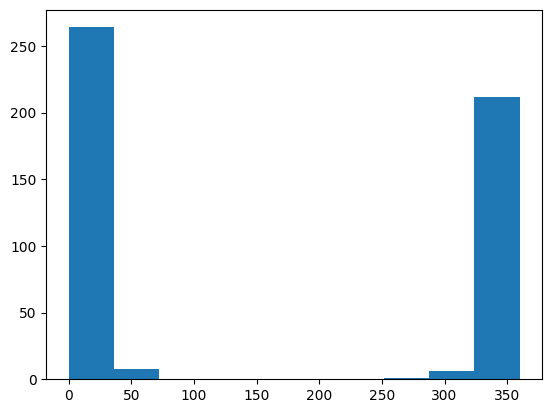

In [44]:
dishes_rotations, all_rotations = get_rotations(dishes_dirs)
plt.hist(all_rotations)

#### Evict similar frames

Using these two functions, we will first calculate the angle of rotation of every frame (relatively to the first frame), then pick the `MAX_FRAMES_PER_DISH` best frames using `topk_max_span`.

The results are stored in a dataframe called `dish_side_angle_df`, which will be used in the following as the list of side angle pictures.


In [1]:
dish_data = []

for dish_rots, cam_rots in dishes_rotations.items():
    dish_name = Path(dish_rots).stem

    for cam, rots in cam_rots.items():
        best_frames_ix = topk_max_span([rot for _, rot in rots], MAX_FRAMES_PER_DISH)
        for ix in best_frames_ix:
            dish_data.append({
                'dish_name': dish_name,
                'cam': cam,
                'rotation': rots[ix][1],
                'frame_path': rots[ix][0]
            })

dish_side_angle_df = pd.DataFrame(dish_data)
print(dish_side_angle_df)


NameError: name 'dishes_rotations' is not defined

### Frames counts

In order to get a global overview of the available data, we list here basic information about the quantity of available data from each dish.

In [ ]:
# Calculate histograms and collect frames
frames = []
num_of_cams = []
num_of_frames = []
for dir in dishes_dirs:
    frames_by_cam = group_dish_frames_by_camera(dir)
    for l in frames_by_cam.values():
        frames.extend(l)

    num_of_cams.append(len([c for c,v in frames_by_cam.items() if v]))
    num_of_frames.append(sum(len(v) for v in frames_by_cam.values()))

In [ ]:
print(f"Dishes count: {len(dishes_dirs)}")
print(f"Total frames count: {len(dish_side_angle_df['frame_path'])}")

# Num of cameras histogram
plt.clf()
plt.title("Number of cameras per dish")
plt.hist(dish_side_angle_df.groupby('dish_name')['cam'].nunique(), bins=np.arange(-0.5, 5.0, 1.0))
plt.xticks(range(5))
plt.show()

# Num of frames histogram
plt.clf()
plt.hist(dish_side_angle_df.groupby('dish_name').size(), bins=30)
plt.title("Total number of frames per dish")
plt.show()

### Dishes properties distributions

Analysis of the core nutritional characteristics and complexity of the dishes in the dataset to establish baseline properties.


In [ ]:
# Dishes attributes distributions
for col in ["calories", "mass", "fat", "carb", "protein"]:
    hist_and_zoom(nutrition_values_df[col], title=f"Distribution of {col}s", bins=60).show()


# Number of ingredients per dish
plt.clf()
plt.hist(dish_ingredients_df.groupby('dish_id').size())
plt.title("Number of ingredients per dish")
plt.show()

# Scatter of the carb/protein/fat repartition
scatter_and_zoom(
    nutrition_values_df['fat'], nutrition_values_df['carb'], nutrition_values_df['protein'],
    title="Distribution of fat/carb/protein",
    labels=("Fat", "Carb", "Protein")
    ).show()


### Correlation trends

This is to make sure our data is balanced and not biased toward obvious correlations between features.

In [ ]:
for col in ['fat', 'carb', 'protein']:
    scatter_and_zoom(
        nutrition_values_df[col], nutrition_values_df['calories'],
        title=f"Correlation between calories and {col}",
        labels=(col.title(), "Calories")
        ).show()

### Low level analysis:

This section analyzes intrinsic properties of the image frames, which is crucial for understanding data quality and potential biases arising from the image capture process.

In [50]:
import os
import dask
from dask import delayed
import numpy as np
from collections import defaultdict
import matplotlib.pyplot as plt
from typing import List, Dict, Any, Tuple
import cv2


def calculate_low_level_features(img_path):
    """
    Calculates low-level features (brightness, color means, blur, dimensions)
    for a single image frame.
    """
    try:
        pil_img = Image.open(img_path)
        img_width, img_height = pil_img.size
        np_img = np.array(pil_img)

        # 2a. Brightness and Color Means (RGB)
        # Calculate mean for each channel
        r_mean, g_mean, b_mean = np.mean(np_img, axis=(0, 1))
        # Overall brightness is the average of the channel means
        brightness = np.mean([r_mean, g_mean, b_mean])

        # 2b. Contrast (Approximated by standard deviation)
        # Std Dev of overall intensity (converted to grayscale for simplicity)
        gray_img_np = np.dot(np_img[...,:3], [0.2989, 0.5870, 0.1140])
        contrast = np.std(gray_img_np)

        # 2c. Blurriness (using Laplacian variance - requires OpenCV)
        # Note: CV2 typically loads BGR, but we use the grayscale conversion
        laplacian_variance = cv2.Laplacian(gray_img_np.astype(np.uint8), cv2.CV_64F).var()

        return {
            'width': img_width,
            'height': img_height,
            'r_mean': r_mean,
            'g_mean': g_mean,
            'b_mean': b_mean,
            'brightness': brightness,
            'contrast_std': contrast,
            'blur_laplacian': laplacian_variance
        }
    except Exception as e:
        print(f"Error processing {img_path}: {e}")
        return None


# --- Core Dask Processing Function ---

@delayed
def process_frame(frame_path: str) -> Dict[str, Any]:
    """
    Calculates features for a single frame. This function is decorated
    with @delayed to make it a Dask task.
    """
    return calculate_low_level_features(frame_path)

@delayed
def aggregate_features(features_list: List[Dict[str, Any]]) -> Dict[str, List[Any]]:
    """
    Aggregates the features from a list of frames into a structured dictionary.
    This runs after all 'process_frame' tasks for a dish/camera are complete.
    """
    r_means = []
    g_means = []
    b_means = []
    brightness = []
    blur_scores = []

    for features in features_list:
        if features:
            r_means.append(features['r_mean'])
            g_means.append(features['g_mean'])
            b_means.append(features['b_mean'])
            brightness.append(features['brightness'])
            blur_scores.append(features['blur_laplacian'])


    return {
        'R': r_means,
        'G': g_means,
        'B': b_means,
        'brightness': brightness,
        'blur': blur_scores,
    }


# --- Main Dask Workflow ---

delayed_features = [
    process_frame(frame_path) for frame_path in dish_side_angle_df['frame_path']
]

# 2. Compute the Results
print("--- Building Dask graph... Start computation... ---")
# Call dask.compute to run the entire graph in parallel
# (using all available cores by default)
results_list = dask.compute(*delayed_features)
print("--- Dask Computation Complete. Aggregating Results for Plotting ---")

# 3. Consolidate Results on the main thread for plotting
all_rgb_means = defaultdict(list)
all_brightness = []
all_blur_scores = []

for result in results_list:
    # Append the lists from each computation batch
    all_rgb_means['R'].extend(result['R'])
    all_rgb_means['G'].extend(result['G'])
    all_rgb_means['B'].extend(result['B'])
    all_brightness.extend(result['brightness'])
    all_blur_scores.extend(result['blur'])

# --- 4. VISUALIZATION (Identical to your original plotting logic) ---

# 4a. RGB Channel Distribution (Global Dataset)
plt.figure(figsize=(12, 5))
for color, data in all_rgb_means.items():
    plt.hist(data, bins=50, alpha=0.6, label=f'{color} Channel Mean', color=color.lower())

plt.title('Global Distribution of Average Image Brightness per RGB Channel')
plt.xlabel('Average Channel Intensity (0-255)')
plt.ylabel('Number of Images')
plt.legend()
plt.grid(axis='y', alpha=0.5)
plt.show()

# 4b. Brightness and Blur Distribution (Box Plots)
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.boxplot(all_brightness, vert=True, patch_artist=True)
plt.title('Dataset Brightness Distribution')
plt.ylabel('Average Brightness (0-255)')

plt.subplot(1, 2, 2)
plt.boxplot(all_blur_scores, vert=True, patch_artist=True)
plt.title('Dataset Blurriness Distribution (Laplacian Variance)')
plt.ylabel('Laplacian Variance Score')
plt.show()

--- Building Dask graph... Start computation... ---
--- Dask Computation Complete. Aggregating Results for Plotting ---


KeyError: 'R'

# Post-EDA cleaning

- Evict blurry frames
- Evict outliers
- Evict corrupted frames (todo in eda)


# Test Train Splits

In [ ]:
DATA_DIR = "/content/Data"
os.makedirs(DATA_DIR, exist_ok=True)  # Create directory if it doesn't exist
cleaned_path = os.path.join(DATA_DIR, "nutrition_values_clean.csv")
nutrition_values_df.to_csv(cleaned_path, index=False)

In [ ]:
from sklearn.model_selection import train_test_split

nutrition_values_df = pd.read_csv(cleaned_path) if os.path.exists(cleaned_path) else None

# === Train/Test Split ===
if nutrition_values_df is not None:
    train_df, test_df = train_test_split(
        nutrition_values_df,
        test_size=0.2,      # 20% for test
        random_state=42,    # reproducibility
        shuffle=True        # shuffle before splitting
    )

    print("Train shape:", train_df.shape)
    print("Test shape:", test_df.shape)

# Model experimentation
